In [1]:
import anndata
import scvelo as scv
import csv
import gzip
import os
import re
import scipy.io
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pylab as plt
from matplotlib import cm
from colorspacious import cspace_converter
from collections import OrderedDict
ast_note_interactivity = "all"

cmaps = OrderedDict()
scv.settings.set_figure_params('scvelo')
sc.settings.verbosity = 3
results_file = "./scvelo_adata"

root_folder_velo = "D:/Raw_data_LSCB/scRNAseqGiuliana/Velocyto"
root_folder_counts = "D:/Raw_data_LSCB/scRNAseqGiuliana"
tmp = os.listdir(root_folder_counts)
filt=["GAS" in x for x in tmp]
datasets=[i for (i, v) in zip(tmp, filt) if v]
print(datasets)

C:\Users\nicki\AppData\Roaming\Python\Python37\site-packages\anndata\_core\anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


['GAS_Day4_batch4', 'GAS_Day4_batch5', 'GAS_Day5_batch3', 'GAS_Day5_batch4', 'GAS_Day6_batch2', 'GAS_Day6_batch3', 'GAS_Day7_batch1', 'GAS_Day7_batch2']


In [2]:
first = True
for dataset in datasets:
    tmp = sc.read_10x_mtx(os.path.join(root_folder_counts,dataset),var_names='gene_symbols',cache=True)
    tmp2 = scv.read(os.path.join(root_folder_velo,dataset+".loom"), cache=True)
    tmp2.var_names_make_unique()
    tmp = scv.utils.merge(tmp,tmp2)
    tmp.obs["Dataset"] = dataset
    if first:
        adata = tmp
        first = False
    else:
        adata = tmp.concatenate(adata,batch_key='batch') # I would like to do ,join='outer' to keep all genes, but err: layers concatenation not yet available and will be ignored

... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


... writing an h5ad cache file to speedup reading next time


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


... writing an h5ad cache file to speedup reading next time


... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [3]:
adata

AnnData object with n_obs × n_vars = 33552 × 31053 
    obs: 'Clusters', 'Dataset', '_X', '_Y', 'batch', 'initial_size', 'initial_size_spliced', 'initial_size_unspliced'
    var: 'gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [4]:
# Cleanup the duplicated gene annotations
adata.var = adata.var[['gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand']]

In [5]:
# Add the dataset name as a prefix to cell names and remove the strings of numbers from the merging:
adata.obs.index = adata.obs.Dataset + "_" + list(adata.obs.index)
adata.obs.index = [x.split("-")[0] for x in adata.obs.index]

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 191 cells that have less than 200 genes expressed
filtered out 7912 genes that are detected in less than 3 cells


In [7]:
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'Dataset' as categorical
... storing 'feature_types' as categorical


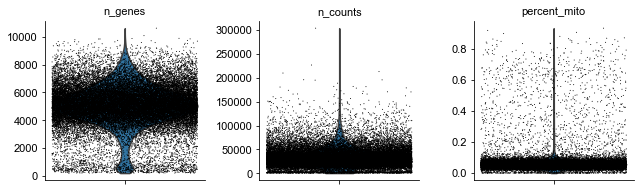

In [8]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],jitter=0.4, multi_panel=True)

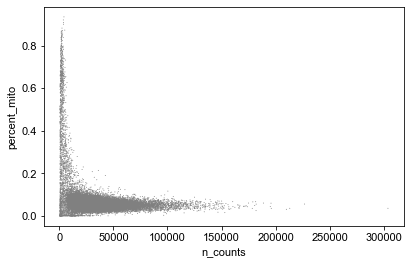

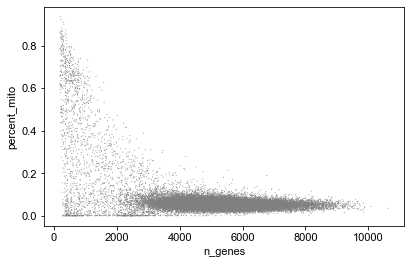

In [9]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_genes', y='percent_mito')

In [10]:
adata = adata[adata.obs.n_genes > 2000, :]
adata = adata[(adata.obs.percent_mito < 0.15) & (adata.obs.percent_mito > 0.015), :]

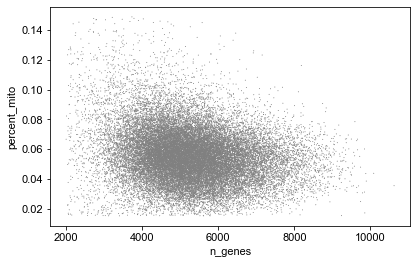

In [11]:
sc.pl.scatter(adata, x='n_genes', y='percent_mito')

In [12]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:01)


In [13]:
sc.pp.log1p(adata)

In [16]:
# To explore several close-ups without reloading the data, can create a backup
#adata_backup = adata
#adata_backup.uns["Backup"] = True # Make a modification to instantiate the copy. 

In [17]:
# This is to restore the backup and then explore another close-up. 
#adata = adata_backup
#adata.uns["Backup"] = False # Make a modification to instantiate the copy. 

In [18]:
adata

AnnData object with n_obs × n_vars = 31206 × 23141 
    obs: 'Clusters', 'Dataset', '_X', '_Y', 'batch', 'initial_size', 'initial_size_spliced', 'initial_size_unspliced', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    uns: 'log1p'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [19]:
os.getcwd()

'C:\\Users\\nicki\\Documents\\PostDoc_LSCB\\20-05-13_Cardiac_Gastruloids\\github'

In [20]:
closeup_name = "GasHeartcloseup"
metadata = pd.read_csv("./OutputTables/"+closeup_name+"_metadata.tsv",sep="\t") # I could have used index_col=0 instead of renaming manually afterwards... next time.
metadata.rename(columns={'Unnamed: 0':'cell_name'},inplace=True)
metadata.index=metadata["cell_name"]
metadata=metadata.drop(['orig.ident','nCount_RNA','nFeature_RNA','percent.mito','cell_name'], axis=1)
varfeats = pd.read_csv("./OutputTables/"+closeup_name+"_varfeats.tsv",sep='\n',header=None, names=["varfeats"])
DR = pd.read_csv("./OutputTables/"+closeup_name+"_DR.tsv",sep="\t",index_col=0)

In [22]:
cells_py = set(adata.obs_names)
cells_R  = set(metadata.index)

# Should update this to highlight how many cells miss on both sides, not only one way around. 
if len(cells_py)==len(cells_R & cells_py):
    print("All the "+str(len(cells_py))+" cells in the python adata object were described in the metadata imported.")
else:
    print("The python adata object has "+str(len(cells_py))+" cells, the metadata loaded describes "+str(len(cells_R & cells_py))+" of them")

print("Gastruloids had "+str(len([x for x in list(metadata.index) if "GAS" in x]))+" cells in Seurat, some are lost because velocyto uses cellranger prefiltering.")

# Importantly, I have now included doublet removal as part of the Seurat workflow, so Seurat is also missing a few cells that were present in the anndata. 
# Need to restrict to the intersection of cells:
cells_keep = list(set(cells_py) & set(cells_R))
adata = adata[cells_keep,:]

All the 14038 cells in the python adata object were described in the metadata imported.
Gastruloids had 14073 cells in Seurat, some are lost because velocyto uses cellranger prefiltering.


In [23]:
adata.raw = adata
adata

In [25]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


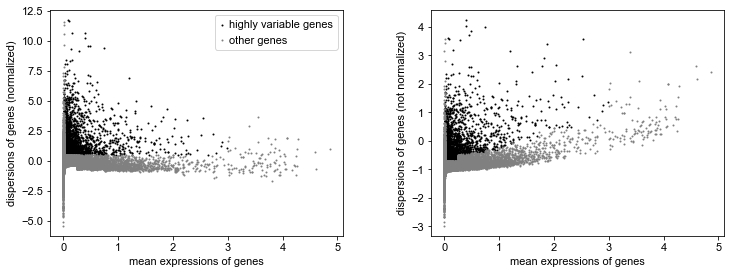

In [26]:
sc.pl.highly_variable_genes(adata)

In [27]:
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 14038 × 2414 
    obs: 'Clusters', 'Dataset', '_X', '_Y', 'batch', 'initial_size', 'initial_size_spliced', 'initial_size_unspliced', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [29]:
sc.pp.scale(adata, max_value=None, zero_center=False)

In [30]:
metadata = metadata.loc[adata.obs_names,:]
UMAP = DR.loc[adata.obs_names,[x for x in DR.columns.tolist() if "UMAP" in x]]
PHATE = DR.loc[adata.obs_names,[x for x in DR.columns.tolist() if "PHATE" in x]]
harmony = DR.loc[adata.obs_names,[x for x in DR.columns.tolist() if "harmony" in x]]

In [31]:
# For simplicity, store the DR as UMAP even when it's actually a PHATE (scvelo provides a umap plot function but not a phate plot function). PHATE plots not retained for publication anyway. 
if not UMAP.empty:
    adata.obsm['X_umap'] = UMAP.to_numpy(dtype="float32")
else:
    adata.obsm['X_umap'] = PHATE.to_numpy(dtype="float32")

In [32]:
adata.obsm['X_harmony'] = harmony.to_numpy(dtype="float32")

In [33]:
adata.obs = adata.obs.drop(labels=["Clusters","_X","_Y"],axis=1)
adata.obs = adata.obs.drop(labels=list(set(adata.obs.columns) & set(metadata.columns)),axis=1)
adata.obs = pd.concat([adata.obs[:], metadata[:]],axis=1)

... storing 'Dataset' as categorical
... storing 'celltype' as categorical
... storing 'stage' as categorical
... storing 'model' as categorical
... storing 'orig.celltype' as categorical
... storing 'aligned.celltype' as categorical


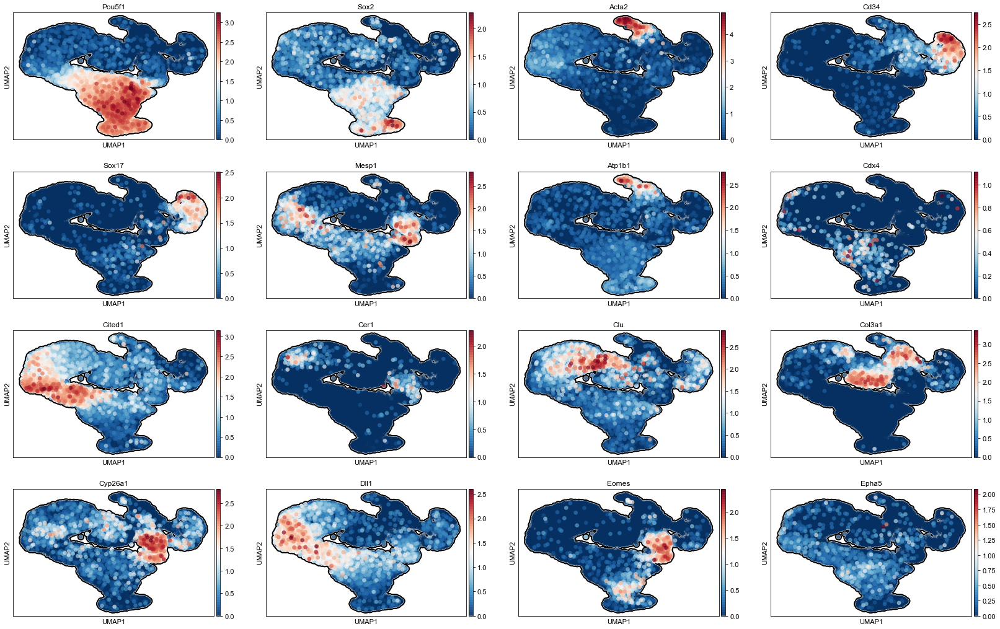

In [34]:
sc.pl.umap(adata, color=["Pou5f1","Sox2","Acta2","Cd34","Sox17","Mesp1","Atp1b1","Cdx4","Cited1","Cer1","Clu","Col3a1","Cyp26a1","Dll1","Eomes","Epha5"], size = 180, use_raw=True, add_outline = True, save="CellTypeMarkers.png")

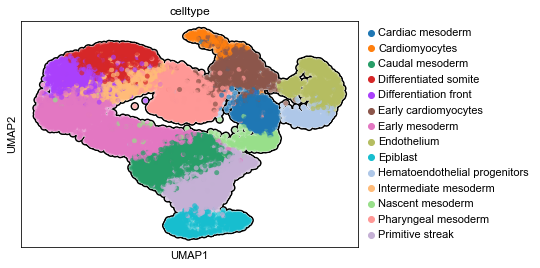

Index(['Cardiac mesoderm', 'Cardiomyocytes', 'Caudal mesoderm',
       'Differentiated somite', 'Differentiation front',
       'Early cardiomyocytes', 'Early mesoderm', 'Endothelium', 'Epiblast',
       'Hematoendothelial progenitors', 'Intermediate mesoderm',
       'Nascent mesoderm', 'Pharyngeal mesoderm', 'Primitive streak'],
      dtype='object')

In [37]:
ident = 'celltype' # Reasonable choices seurat_clusters or celltype
sc.pl.umap(adata, color=['celltype'], add_outline = True ,size=100) # Need to make a umap or celltype is not categorical and next line crashes. 
adata.obs['celltype'].cat.categories

In [39]:
adata.uns["stage_colors"] = ['#6165fb','#f854ee','#f85454','#f8ea54']
cluster_colors = pd.read_csv("./InputTables/ClusterColors.tsv",sep="\t",index_col=False,header=0,)
cluster_colors.head()

,transferred_identity,ab_initio_identity,color
0,Erythroid3,NaN,#c051ff
1,Erythroid2,NaN,#cd51ff
2,Erythroid1,NaN,#f25dfe
3,Blood progenitors 2,NaN,#e851ff
4,Blood progenitors 1,NaN,#f25dfe


In [40]:
tmp = {cluster_colors.loc[i,"ab_initio_identity"]:cluster_colors.loc[i,"color"] for i in range(0,cluster_colors.shape[0]) if cluster_colors.loc[i,"ab_initio_identity"]==cluster_colors.loc[i,"ab_initio_identity"]}
adata.uns["celltype_colors"] = [tmp[i] for i in adata.obs['celltype'].cat.categories[:].values]

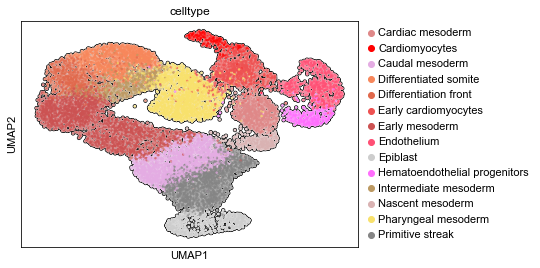

In [41]:
sc.pl.umap(adata, color=['celltype'], add_outline = True ,size=25,save="CellTypes.pdf")

In [42]:
velo_mode = "deterministic" #stochastic, deterministic, dynamical
if velo_mode == "dynamical":
    scv.tl.recover_dynamics(adata)
scv.tl.velocity(adata, mode=velo_mode, enforce=True)

Normalized count data: spliced, unspliced.
computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:02)
computing neighbors
    finished (0:00:14) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)
computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [43]:
scv.tl.velocity_graph(adata)

computing velocity graph
    finished (0:02:36) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [44]:
print(adata.uns['velocity_graph'][1:10,1:10])

  (0, 5)	0.13762881
  (5, 0)	0.058308825


computing velocity embedding
    finished (0:00:04) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_Velocity_deterministic_stage.png


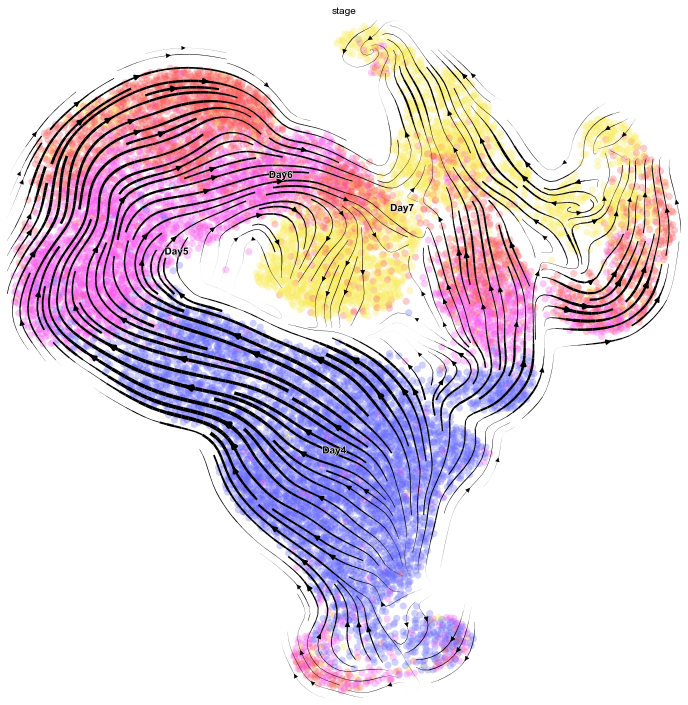

In [45]:
ident = "stage" # celltype or stage or other
filetype = "png" # png or svg (convert to pdf with illustrator to bypass a bug)
scv.pl.velocity_embedding_stream(adata, basis='umap',figsize=(12,12), size = 200, density=1.5, color=ident,cutoff_perc=0.2,linewidth=2,save="Velocity_"+velo_mode+"_"+ident+"."+filetype) 

saving figure to file ./figures/scvelo_Velocity_deterministic_arrows_celltype.png


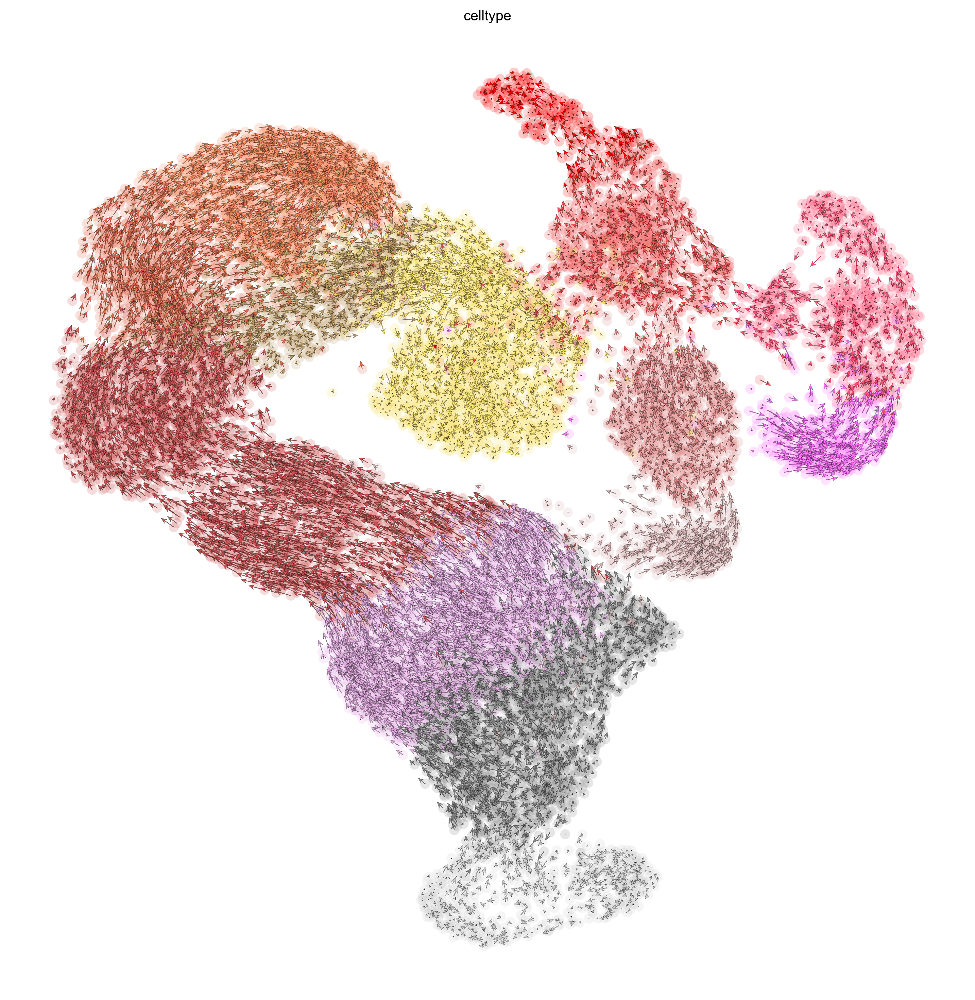

In [46]:
ident = "celltype" # celltype or stage
scv.pl.velocity_embedding(adata, arrow_length=8.3, arrow_size=1, figsize=(12,12), size = 200, color=ident, dpi=300,save="Velocity_"+velo_mode+"_arrows_"+ident+".png")

saving figure to file ./figures/scvelo_Velocity_deterministic_grid_celltype.png


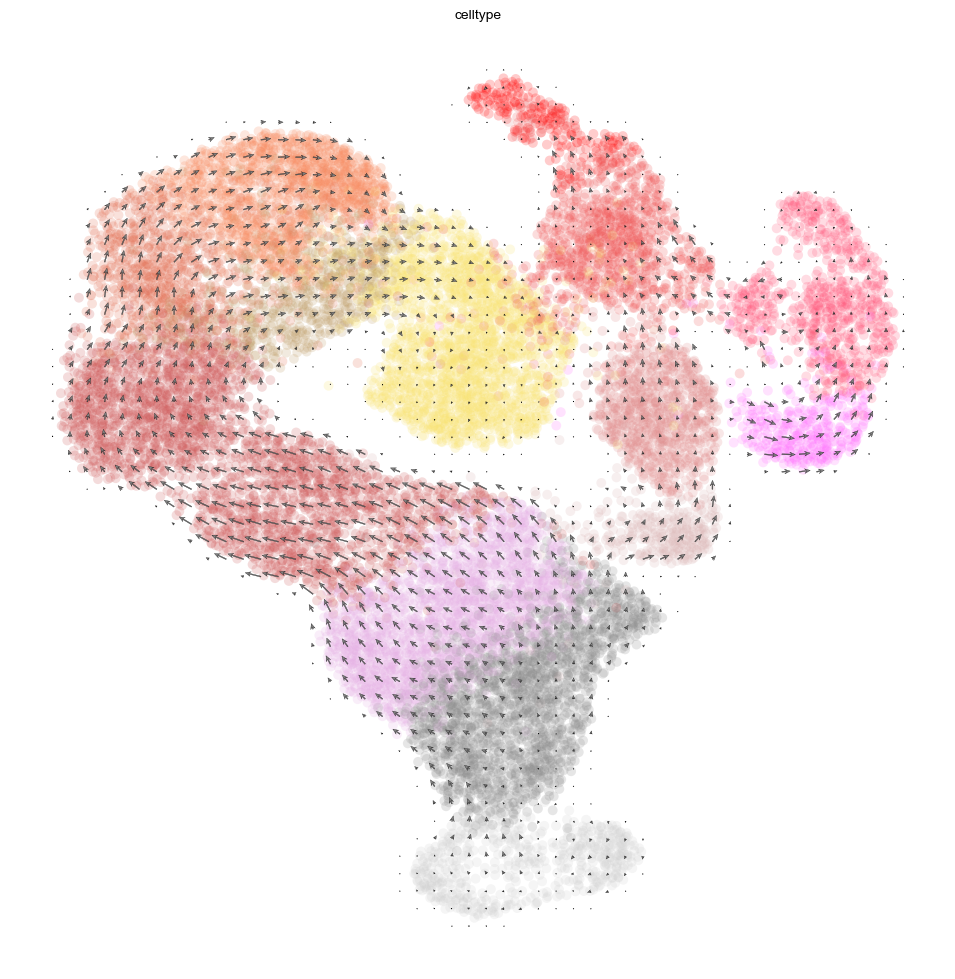

In [47]:
ident = "celltype" # celltype or stage
scv.pl.velocity_embedding_grid(adata, arrow_length=2, arrow_size=1, figsize=(12,12), size = 200, color=ident, dpi=100,save="Velocity_"+velo_mode+"_grid_"+ident+".png")

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


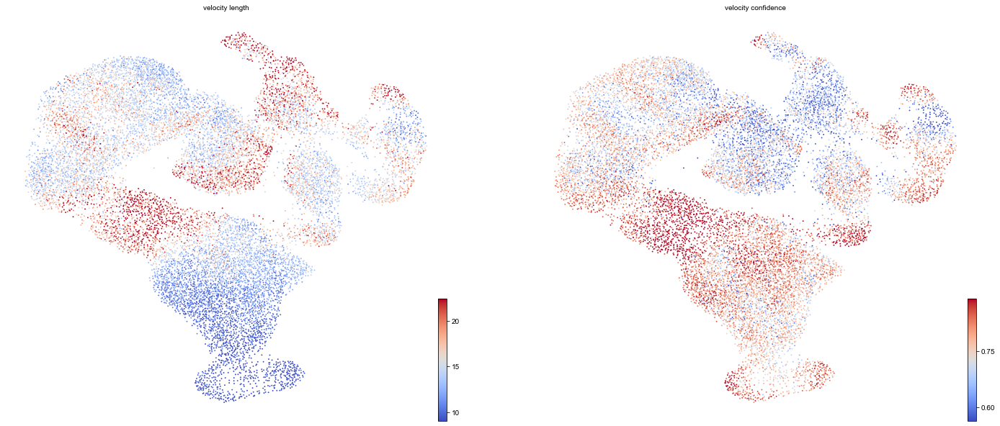

In [48]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95],figsize=(12,10))

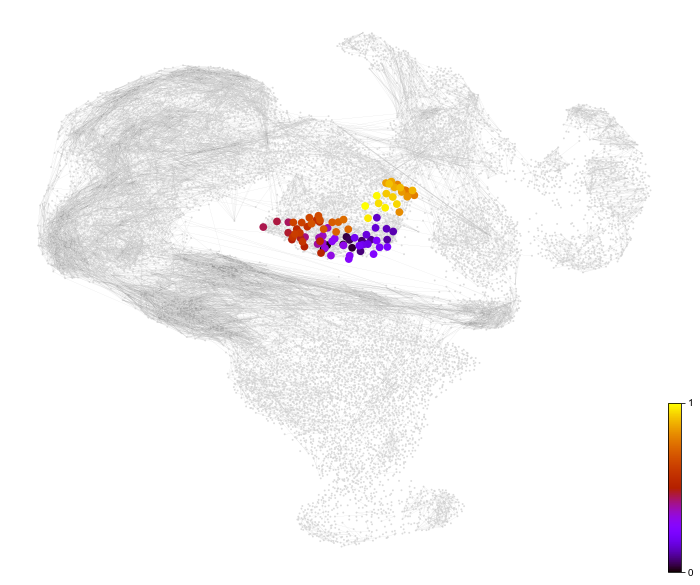

In [49]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=1000)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False, figsize=(12,10),threshold=.1)
ax = scv.pl.scatter(adata, x=x, y=y, s=240, c='descending', cmap='gnuplot', ax=ax)

In [53]:
tmp = scv.utils.get_transition_matrix(adata,scale=1,use_negative_cosines=True,self_transitions=False)
scipy.io.mmwrite("OutputTables/transition_matrix", tmp, comment='', field=None, precision=None, symmetry=None)

In [54]:
adata.obs.to_csv("OutputTables/ScVelo_CellMetadata.csv")

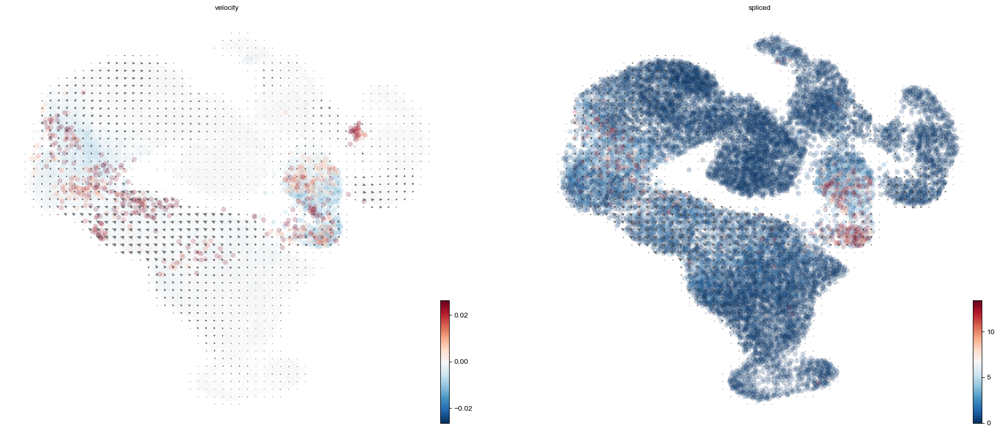

In [52]:
scv.pl.velocity_embedding_grid(adata, color='Mesp1',layer=['velocity', 'spliced'], arrow_size=1.5,size=200,dpi=100,figsize=(12,10))